# Food 101 challenge summary
Food-101 is a challenging vision problem, but everyone can relate to it.  Recent SoTA is ~80% top-1, 90% top-5.  These approaches rely on lots of TTA, large networks and  even novel architectures.

Train a decent model >85% accuracy for top-1 for the test set, using a ResNet50 or smaller network with a reasonable set of augmentations.

Recognizing food is a challenging problem for computer vision. The same dish can appear very differently on image, due to several factors like variation in recipe, lighting, spatial layout. At the same time, different dishes can look very much alike due to their similar color, texture, ingredients.  

## Current state of the art

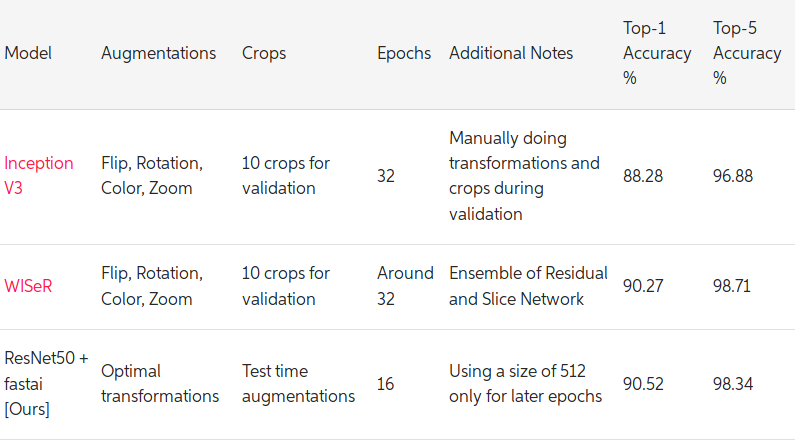
(https://platform.ai/blog/page/3/new-food-101-sota-with-fastai-and-platform-ais-fast-augmentation-search/)

<br>

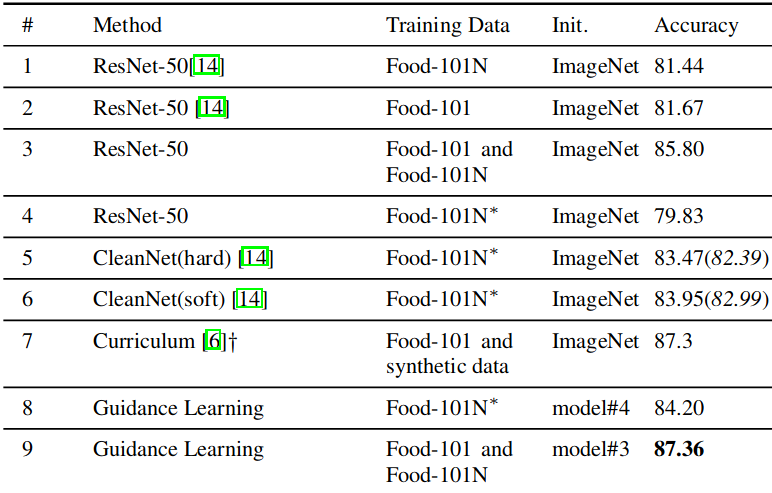
(https://arxiv.org/pdf/1907.11384.pdf)

In [1]:
import os
import random
import shutil

from pathlib import Path
import urllib

import numpy as np
import pandas as pd
from PIL import Image
import matplotlib.pyplot as plt

from fastai.vision import *

## Load data

In [2]:
# Input root directory
input_root_dir = "../input/food-101/food-101/food-101"
input_root_path = Path(input_root_dir)
print(os.listdir(input_root_dir))


['images', 'meta', '.DS_Store', 'license_agreement.txt', 'README.txt']


In [3]:
# Image directory
image_dir_path = input_root_path/'images'
image_categories = os.listdir(image_dir_path)
image_categories.remove('.DS_Store')

# Peek at the categories and their total number
print(image_categories)
print(len(image_categories))

['mussels', 'samosa', 'french_onion_soup', 'tiramisu', 'macaroni_and_cheese', 'bread_pudding', 'chicken_wings', 'greek_salad', 'shrimp_and_grits', 'croque_madame', 'prime_rib', 'clam_chowder', 'grilled_salmon', 'bibimbap', 'oysters', 'grilled_cheese_sandwich', 'french_toast', 'peking_duck', 'panna_cotta', 'pancakes', 'beet_salad', 'fish_and_chips', 'strawberry_shortcake', 'ravioli', 'bruschetta', 'churros', 'pad_thai', 'cheese_plate', 'hummus', 'pulled_pork_sandwich', 'poutine', 'sushi', 'fried_calamari', 'gyoza', 'onion_rings', 'foie_gras', 'beef_carpaccio', 'red_velvet_cake', 'caprese_salad', 'edamame', 'huevos_rancheros', 'frozen_yogurt', 'baklava', 'eggs_benedict', 'club_sandwich', 'breakfast_burrito', 'chicken_quesadilla', 'nachos', 'chocolate_cake', 'ceviche', 'pork_chop', 'cheesecake', 'hamburger', 'caesar_salad', 'garlic_bread', 'spaghetti_bolognese', 'chocolate_mousse', 'guacamole', 'lobster_bisque', 'chicken_curry', 'steak', 'waffles', 'paella', 'spaghetti_carbonara', 'cannol

In [4]:
# Peek inside the meta directory
os.listdir(input_root_path/'meta')

['labels.txt',
 'train.txt',
 'test.txt',
 'train.json',
 'test.json',
 'classes.txt']

In [5]:
# Contruct a pandas DataFrame from the given meta file, storing the filepath, category, train/validation set
def get_df_from_file(file_path, is_valid):   
    img_df = pd.read_csv(file_path, sep=';', names=['raw_txt'])
    # Append .jpg extension to all file names
    img_df['full_file_name'] = img_df['raw_txt'] + '.jpg'
    
    regex_pattern = r'(.+)\/(.+)'
    # Format of each line in input file is: category/filename, so extract according to this pattern
    extracted_df = img_df['full_file_name'].str.extract(regex_pattern)
    extracted_df.columns = ['category', 'file_name']

    # Join extracted values and set is_valid
    img_df = pd.DataFrame.join(img_df, extracted_df)
    img_df['is_valid'] = is_valid
    return img_df

In [6]:
# Load the train set
train_txt_file_path = (input_root_path.joinpath('meta', 'train.txt'))
train_df = get_df_from_file(train_txt_file_path, False)
print(train_df.shape)

# Load the validation set
test_txt_file_path = (input_root_path.joinpath('meta', 'test.txt'))
test_df = get_df_from_file(test_txt_file_path, True)
print(test_df.shape)

# Concatenate train and test sets
image_df = pd.concat([train_df, test_df])
display(image_df.sample(10))
print(image_df.shape)

# 75750 entries in train and 25250 entries in test

(75750, 5)
(25250, 5)


,raw_txt,full_file_name,category,file_name,is_valid
32189,french_toast/718426,french_toast/718426.jpg,french_toast,718426.jpg,False
11330,frozen_yogurt/1942235,frozen_yogurt/1942235.jpg,frozen_yogurt,1942235.jpg,True
57648,pizza/668944,pizza/668944.jpg,pizza,668944.jpg,False
4315,cheese_plate/1877687,cheese_plate/1877687.jpg,cheese_plate,1877687.jpg,True
46954,macaroni_and_cheese/312480,macaroni_and_cheese/312480.jpg,macaroni_and_cheese,312480.jpg,False
14817,lasagna/2218092,lasagna/2218092.jpg,lasagna,2218092.jpg,True
2596,beef_carpaccio/2488900,beef_carpaccio/2488900.jpg,beef_carpaccio,2488900.jpg,False
54518,pancakes/3608724,pancakes/3608724.jpg,pancakes,3608724.jpg,False
7654,deviled_eggs/3151395,deviled_eggs/3151395.jpg,deviled_eggs,3151395.jpg,True
64367,samosa/39518,samosa/39518.jpg,samosa,39518.jpg,False


(101000, 5)


## Visualize image transformation

In [7]:
# Visualize transforms separately on a random image
def display_transform(img_df, img_dir_path, transform, min_value, max_value, 
                      columns=6, width=24, height=16):
    # Sample an image from the whole dataset
    sample_file_name = img_df.sample(1)['full_file_name'].iloc[0]
    img = open_image(img_dir_path/sample_file_name)
    img.show(title=sample_file_name + ' - ' + str(transform))
    
    fig, axes = plt.subplots(1, columns, figsize=(width,height))
    
    # Visualize different levels of variation
    for value, axis in zip(np.linspace(min_value, max_value, columns), axes):
        # open a new image, cause old image has been transformed
        img = open_image(img_dir_path/sample_file_name)
        transform(img, value).show(ax=axis, title=f'value={value:.4f}')
        

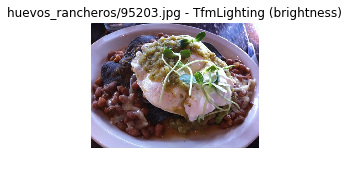

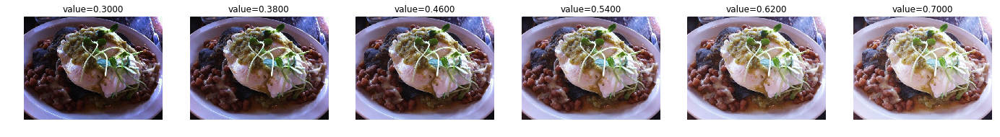

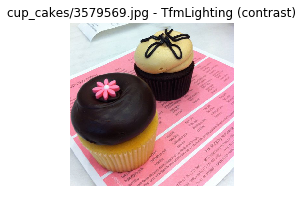

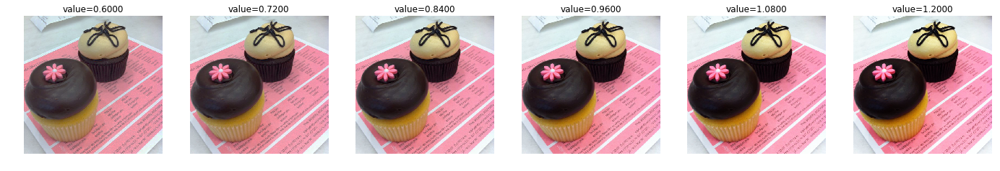

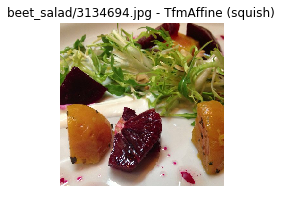

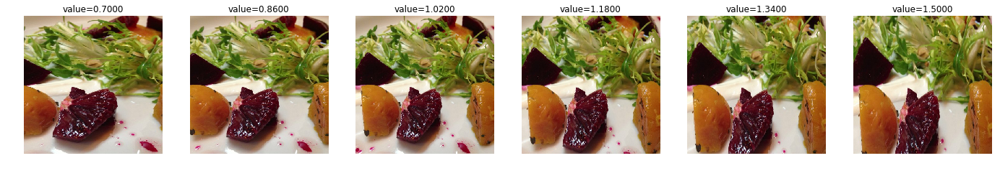

In [8]:
display_transform(image_df, image_dir_path, brightness, 
                  min_value = 0.5 - 0.2, max_value = 0.5 + 0.2)
display_transform(image_df, image_dir_path, contrast, 
                  min_value = 1 - 0.4, max_value = 1 + 0.2)
display_transform(image_df, image_dir_path, squish,
                  min_value = 1 - 0.3, max_value = 1 + 0.5)

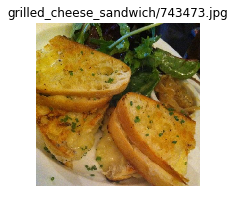

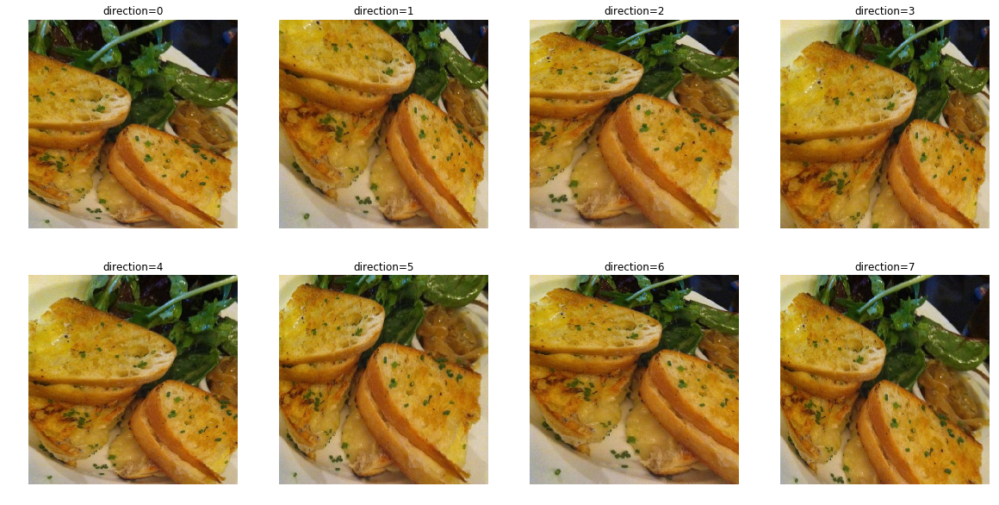

In [9]:
# Displaying skew requires a different logic than the other transforms
def display_skew_transform(img_df, img_dir_path, rows=2, columns=4, width=20, height=10):
    sample_file_name = img_df.sample(1)['full_file_name'].iloc[0]
    img = open_image(img_dir_path/sample_file_name)
    img.show(title=sample_file_name)

    fig, axs = plt.subplots(rows, columns, figsize=(width,height))
    for i, ax in enumerate(axs.flatten()):
        # open a new image, cause old image has been transformed
        open_image(img_dir_path/sample_file_name).skew(i, 0.7).show(ax=ax, title=f'direction={i}')

display_skew_transform(image_df, image_dir_path)

There are some extreme transformation cases. However, during training, these extremes should be attenuated by randomization.
At the same time, the dataset also contains extreme examples (e.g. very dark, very low contrast). We should let the model see more extreme cases, so it will have a better chance of performing well in practice.

In [10]:
# Define transforms used for data augmentation
# By default, only horizontal flip is used, not vertical flip
# Disable default lighting alteration, and use brightness and constrast for finer control
image_transforms = get_transforms(
    max_rotate=10,
    max_zoom=1.1,
    max_lighting=None,
    max_warp=0.2,
    xtra_tfms=[
        brightness(change=(0.5-0.2, 0.5+0.2), p=0.75),
        contrast(scale=(1-0.4, 1+0.2), p=0.75),
        squish(scale=(1-0.3, 1+0.5), p=0.75),
        skew(direction=(0, 7), magnitude=random.randint(0,6)/10, p=0.75),
    ]
)

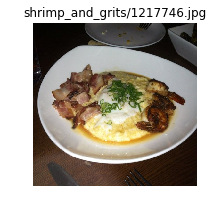

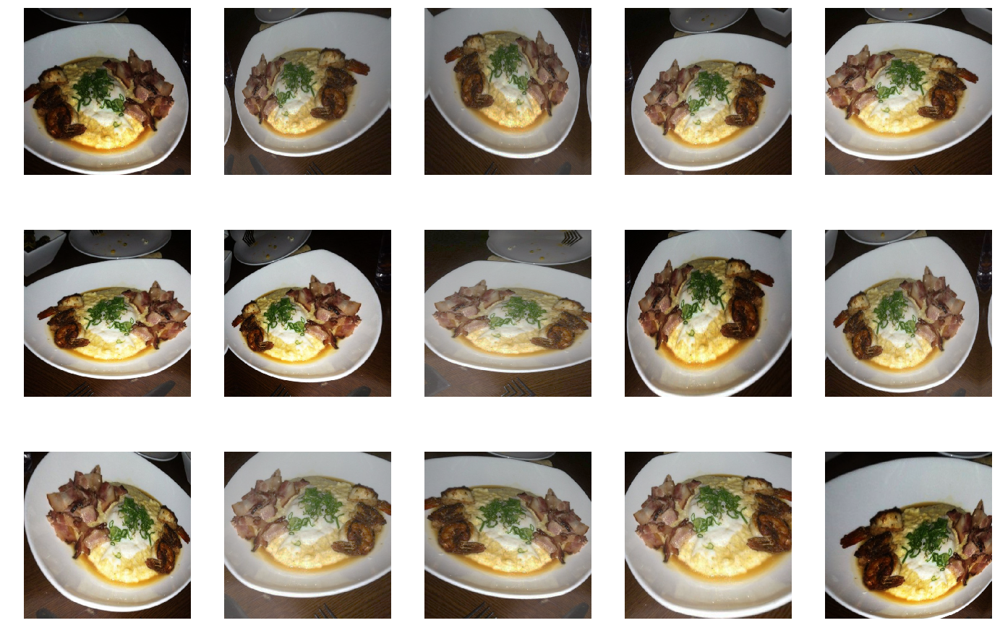

In [11]:
# Display all random transforms combined on the same random image
def display_combined_transforms(img_df, img_dir_path, img_transforms, 
                                rows=3, columns=5, width=24, height=16):
    sample_file_name = img_df.sample(1)['full_file_name'].iloc[0]
    img = open_image(img_dir_path/sample_file_name)
    img.show(title=sample_file_name)
    
    fig, axes = plt.subplots(rows, columns, figsize=(width, height))
    
    for row in range(rows):
        for axis in axes[row]:
            transformed_img = img.apply_tfms(img_transforms[0])
            transformed_img.show(ax=axis)

display_combined_transforms(image_df, image_dir_path, image_transforms)

In [12]:
# Loading image to a ImageList from path in DataFrame
split_and_labeled_images = (ImageList.from_df(
    image_df, 
    image_dir_path,
    cols='full_file_name',    
))

# Split image into train and validation set based on the is_valid column
split_and_labeled_images = split_and_labeled_images.split_from_df(col='is_valid')

# Label images based on category column
split_and_labeled_images = split_and_labeled_images.label_from_df(cols='category')

print(split_and_labeled_images)

LabelLists;

Train: LabelList (75750 items)
x: ImageList
Image (3, 512, 308),Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512)
y: CategoryList
apple_pie,apple_pie,apple_pie,apple_pie,apple_pie
Path: ../input/food-101/food-101/food-101/images;

Valid: LabelList (25250 items)
x: ImageList
Image (3, 512, 512),Image (3, 512, 384),Image (3, 512, 384),Image (3, 512, 382),Image (3, 342, 512)
y: CategoryList
apple_pie,apple_pie,apple_pie,apple_pie,apple_pie
Path: ../input/food-101/food-101/food-101/images;

Test: None


There are 75750 images in the train set and 25250 in the validation set.
The images have 3 color channels and are of various sizes

In [13]:
image_batch_size = 64
transform_image_size = (256, 256)

# Set transform, final size and resize method
# Normalize with ImageNet stats, because the chosen model will be ResNet pre-trained with ImageNet
image_data_bunch = (
    split_and_labeled_images.transform(
        image_transforms, 
        size=transform_image_size, 
        resize_method=ResizeMethod.SQUISH)
    .databunch(bs=image_batch_size)
    .normalize(imagenet_stats)
)

# Peek inside the DataBunch
# It contains images of size 256 x 256 with 3 color channels
print(image_data_bunch)

ImageDataBunch;

Train: LabelList (75750 items)
x: ImageList
Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256)
y: CategoryList
apple_pie,apple_pie,apple_pie,apple_pie,apple_pie
Path: ../input/food-101/food-101/food-101/images;

Valid: LabelList (25250 items)
x: ImageList
Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256)
y: CategoryList
apple_pie,apple_pie,apple_pie,apple_pie,apple_pie
Path: ../input/food-101/food-101/food-101/images;

Test: None


We still have the same train and validation sets. The images still have 3 color channels, but all of them have been resized to 256 x 256

In [14]:
# Check the categories and their total count
print(image_data_bunch.classes)
print(len(image_data_bunch.classes))
print(image_data_bunch.c)

['apple_pie', 'baby_back_ribs', 'baklava', 'beef_carpaccio', 'beef_tartare', 'beet_salad', 'beignets', 'bibimbap', 'bread_pudding', 'breakfast_burrito', 'bruschetta', 'caesar_salad', 'cannoli', 'caprese_salad', 'carrot_cake', 'ceviche', 'cheese_plate', 'cheesecake', 'chicken_curry', 'chicken_quesadilla', 'chicken_wings', 'chocolate_cake', 'chocolate_mousse', 'churros', 'clam_chowder', 'club_sandwich', 'crab_cakes', 'creme_brulee', 'croque_madame', 'cup_cakes', 'deviled_eggs', 'donuts', 'dumplings', 'edamame', 'eggs_benedict', 'escargots', 'falafel', 'filet_mignon', 'fish_and_chips', 'foie_gras', 'french_fries', 'french_onion_soup', 'french_toast', 'fried_calamari', 'fried_rice', 'frozen_yogurt', 'garlic_bread', 'gnocchi', 'greek_salad', 'grilled_cheese_sandwich', 'grilled_salmon', 'guacamole', 'gyoza', 'hamburger', 'hot_and_sour_soup', 'hot_dog', 'huevos_rancheros', 'hummus', 'ice_cream', 'lasagna', 'lobster_bisque', 'lobster_roll_sandwich', 'macaroni_and_cheese', 'macarons', 'miso_sou

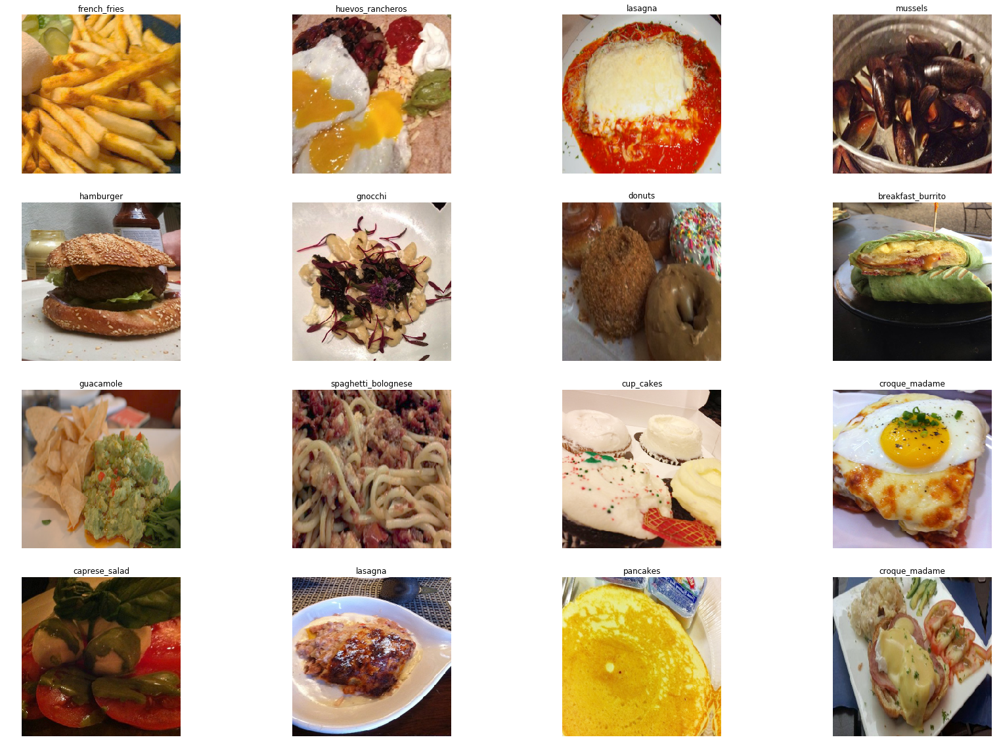

In [15]:
# Visualize some images, with transforms applied randonmly
image_data_bunch.show_batch(rows=4, figsize=(24,16))

## How does CNN work?

<img src="https://brohrer.github.io/images/cnn3.png" width="600">
(https://brohrer.github.io/how_convolutional_neural_networks_work.html)

Convolutions look for pieces of features in the image. In the figure above, we can see that the CNN is trying to match the green, orange and violet pieces between 2 pictures. Then, after several examples, the CNN can learn to detect patterns and small pieces of features.

A CNN consists of a chain of several convolution layers. The outputs of lower level layers become the inputs of higher level layers.

<img src="https://brohrer.github.io/images/cnn18.png" width="600">
(http://web.eecs.umich.edu/~honglak/icml09-ConvolutionalDeepBeliefNetworks.pdf)

Lower level convolutions pick up simple features like edges, basic shape. Higher level convolutions take these simple features and combine them to form more and more complex features. In the illustration above, we can see that lines and circles are combined to form eyes, noses, mouths, which then are combined to form human faces.

## What is ResNet?

<img src="http://cs231n.github.io/assets/nn1/layer_sizes.jpeg" width="600">
(http://cs231n.github.io/neural-networks-1/#arch)

The deeper a neural network is, the more complex patterns it can capture.
At the same time, a deeper network is also more prone to overfitting.


<img src="http://teleported.in/post_imgs/12-deepnet-errors.png" width="600">
(https://arxiv.org/abs/1512.03385)

However, something strange happens when we compare a deeper network (56 layers) with a shallower network (20 layers) in practice.
The deeper network is expected to overfit and have lower training error, but the opposite happens.

The idea behind ResNet is to create a deeper network that performs at least equally well as a shallower network.


<img src="http://teleported.in/post_imgs/12-residual-net.png" width="600">
(https://arxiv.org/abs/1512.03385)

The figure above illustrates the core concept of ResNet: Skip Connection. Here, instead of simply using the activation of the layer (F(x)), we add the input (x) to the activation (F(x) + x) to form the new output of the layer.
If the weights of this layer are all 0 (F(x) = 0), then this is simply an identity mapping. The input can skip through unchanged.
Thus, the deeper network has a way of adjusting itself to become the equivalent of the shallower network.


<img src="https://raw.githubusercontent.com/hiromis/notes/master/lesson7/9.png" width="600">
(https://arxiv.org/pdf/1712.09913.pdf)

It turns out that, the Skip Connections are extremely helpful by making the loss surface much smoother, thus much easier to optimize.

Since then, ResNet has become a widely used architecture. Models built with ResNet usually train fast and perform well.

https://mlperf.org/training-overview/#overview

https://mlperf.org/inference-overview/#overview

## Train the model

In [16]:
# Leverage transfer learning from a ResNet50 pre-trained with ImageNet

image_learner = cnn_learner(
    image_data_bunch,
    models.resnet50,
    metrics=accuracy,
    wd=1e-1,
)

# Change the output directory to the current working directory
image_learner.model_dir = os.getcwd()
image_learner.path = Path(os.getcwd())

# Display model architecture
# image_learner.model

Downloading: "https://download.pytorch.org/models/resnet50-19c8e357.pth" to /tmp/.cache/torch/checkpoints/resnet50-19c8e357.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 139MB/s]


## How do we choose learning rates?

If the learning rate is too slow, training will take a lot of time.
If the learning rate is too high, we will be jumping around the minimum loss, getting farther and farther from the minimum and never reach it.

So to start the experiment of finding a learning rate, we train the model while increasing the learning rate. Then we plot the loss against the learning rate, and stop when the loss starts to explode.

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


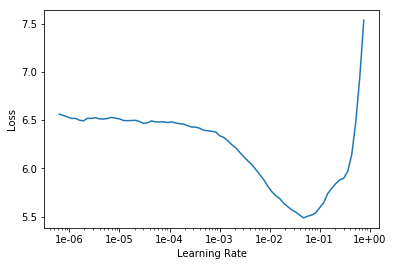

In [17]:
# Finding a good learning rate

image_learner.lr_find()
image_learner.recorder.plot()

Then, we divide the training into 2 parts of a cycle.
In the 1st part, we gradually increase the learning rate to a maximum value.
In the 2nd part, we gradually decrease the learning rate.
The learning rate and momentum are plotted below. For more explanations, please see the paragraph following the plot.

In [18]:
# Start of training

In [19]:
last_block_lr = 1e-2

# Train with 1 cycle policy

image_learner.fit_one_cycle(7, slice(last_block_lr))
image_learner.save('stage1-resnet50-size256', return_path=True)

# More explanations about the different settings for learning rate in fit one cycle are here:
# https://github.com/hiromis/notes/blob/master/Lesson5.md

epoch,train_loss,valid_loss,accuracy,time
0,1.978314,1.356794,0.630812,23:01
1,1.810494,1.243657,0.657584,21:29
2,1.651526,1.173133,0.681980,22:04
3,1.466889,1.000281,0.723208,19:51
4,1.340560,0.865791,0.760832,20:50
5,1.163939,0.756955,0.791089,19:56
6,1.078415,0.722100,0.799921,21:03


PosixPath('/kaggle/working/stage1-resnet50-size256.pth')

fast.ai freezes the pre-trained part when we create the model. So up to this point, we only trained the last layer block. Next, we will unfreeze the pre-trained part and train the whole model. 

In [20]:
# Now unfreeze the pre-trained part.
image_learner.unfreeze()

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


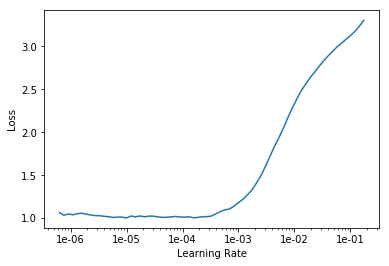

In [21]:
# We need another learning rate for the unfrozen model
image_learner.lr_find()
image_learner.recorder.plot()

The pre-trained part should have a smaller learning rate, so that the weights only vary a little.
If the learning rate for the pre-trained part is too high, we risk losing what the model has learned.

Meanwhile, the not-pre-trained part should have a higher learning rate, so it will converge faster.

In [22]:
# Still using the 1 cyle policy, but with discriminative learning rate

image_learner.fit_one_cycle(7, slice(1e-4, last_block_lr/5))
image_learner.export(os.path.join(os.getcwd(), 'stage2-resnet50-size256-export.pkl'))
image_learner.save("stage2-resnet50-size256", return_path=True)

epoch,train_loss,valid_loss,accuracy,time
0,1.341945,1.047741,0.710891,21:29
1,1.467523,1.182810,0.682455,20:53
2,1.331640,0.944340,0.734970,21:21
3,1.075482,0.723043,0.798535,21:22
4,0.877563,0.589919,0.836040,21:20
5,0.647601,0.504141,0.859366,21:13
6,0.584599,0.483763,0.865228,21:39


PosixPath('/kaggle/working/stage2-resnet50-size256.pth')

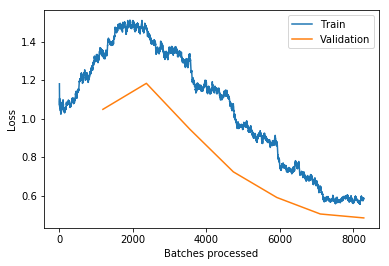

In [23]:
# Plot loss history
image_learner.recorder.plot_losses()

This is a typical loss evolution shape, due to the 1 cycle policy.
Loss increases at first, while the learning rate cycle is in the upward phase.
Then loss decreases in the downward phase of the learning rate cycle, as we are now closer to the optimum range.

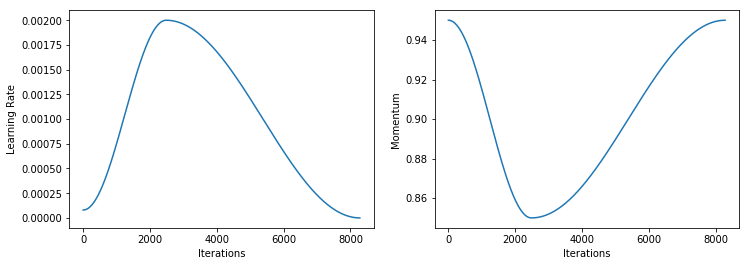

In [24]:
# Plot the cycle of learning rate and momentum
image_learner.recorder.plot_lr(show_moms=True)

In the 1st half of the cycle, by combining a higher learning rate with a lower momentum, we encourage the model to explore a wider area of the whole loss surface. This leads to a better generalization of the model, and reduces the chance of overfitting.
Then in the 2nd half of the cycle, we are already in a generally good area of the loss surface. Therefore, we decrease the learning rate and increase the momentum to help the model find a local minimum of that area.

(For more information, [this article](https://sgugger.github.io/the-1cycle-policy.html) explains the approach suggested in [this paper](https://arxiv.org/abs/1803.09820))



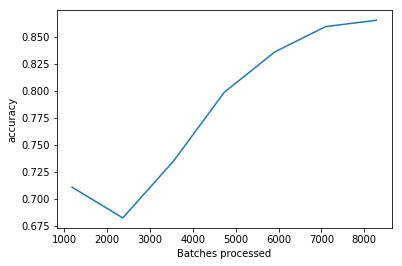

In [25]:
# Plot metrics history 
image_learner.recorder.plot_metrics()

In [26]:
# End of training

In [27]:
print(image_learner.metrics)

[<function accuracy at 0x7f2493081268>]


In [28]:
# Check the final validation accuracy
image_learner.validate(image_learner.data.valid_dl)

[0.48376346, tensor(0.8652)]

Here is the description of the validate function from the [fast.ai documentation of validate](https://docs.fast.ai/basic_train.html#Learner.validate)
> Return the calculated loss and the metrics of the current model on the given data loader dl

Our chosen metric is accuracy.

The accuracy here is the top 1 accuracy for the test set, as specified in the meta files of the dataset.
Below is an explaining example from the [fast.ai documentation of accuracy](https://docs.fast.ai/metrics.html#accuracy)

In [29]:
ys = tensor([1], [0], [1], [0], [1])
preds = tensor([0.4, 0.6], [0.3, 0.7], [0.2, 0.8], [0.6, 0.4], [0.9, 0.1]) # bs = 5, n = 2
print(accuracy(preds, ys))

tensor(0.6000)


Here we have 5 actual labels (ys) and 5 predictions (preds) for a binary classification problems. 
The actual labels contain the target classes (0 and 1)
The predictions contain probabilities for each of the classes in order.

For example: the 1st prediction shows a probability of 0.4 for class 0 and 0.6 for class 1.
The model simply picks the class with the highest probability (argmax function). Class 1 has the highest probability here (0.6).
The corresponding actual label for this prediction is 1. Thus, this is counted as a good prediction.

There are 2 other good predictions in this series: the 3rd prediction [0.2, 0.8] which matches class 1, and the 4th prediction [0.6, 0.4] which matches class 0.

As a consequence, the accuracy is computed as 3 good predictions over 5 predictions in total, which gives 0.6 (3/5).

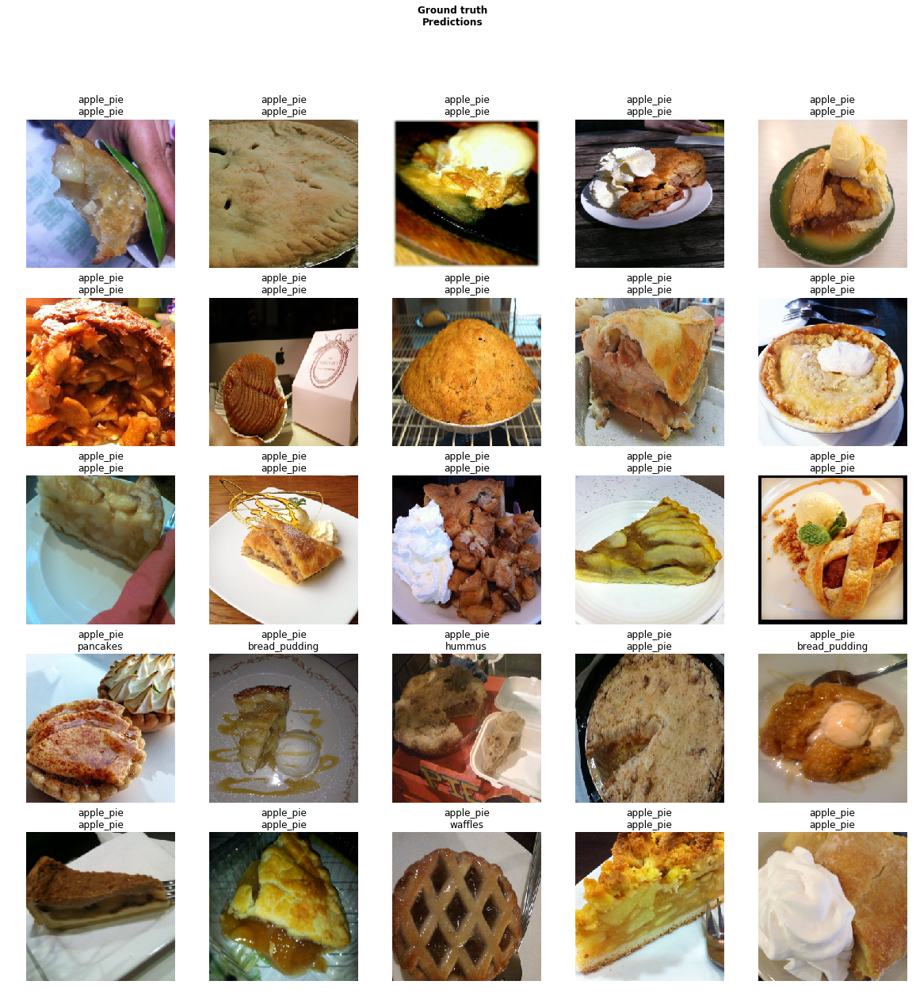

In [30]:
# Visualize a few results
image_learner.show_results(ds_type=DatasetType.Valid)

In [31]:
# Some useful interpretation
interpreter = ClassificationInterpretation.from_learner(image_learner)

In [32]:
# Display the most confused categories, min_val = error threshold for display
interpreter.most_confused(min_val=10)

[('steak', 'filet_mignon', 47),
 ('filet_mignon', 'steak', 25),
 ('prime_rib', 'steak', 24),
 ('tuna_tartare', 'beef_tartare', 23),
 ('chocolate_cake', 'chocolate_mousse', 22),
 ('chocolate_mousse', 'chocolate_cake', 22),
 ('pork_chop', 'steak', 22),
 ('beef_tartare', 'tuna_tartare', 20),
 ('apple_pie', 'bread_pudding', 18),
 ('pork_chop', 'grilled_salmon', 18),
 ('pork_chop', 'filet_mignon', 17),
 ('baby_back_ribs', 'steak', 15),
 ('club_sandwich', 'grilled_cheese_sandwich', 15),
 ('ice_cream', 'frozen_yogurt', 15),
 ('ravioli', 'gnocchi', 15),
 ('steak', 'pork_chop', 15),
 ('bread_pudding', 'apple_pie', 13),
 ('beignets', 'donuts', 12),
 ('cheesecake', 'carrot_cake', 12),
 ('dumplings', 'gyoza', 12),
 ('steak', 'prime_rib', 12),
 ('breakfast_burrito', 'chicken_quesadilla', 11),
 ('breakfast_burrito', 'huevos_rancheros', 11),
 ('falafel', 'crab_cakes', 11),
 ('hamburger', 'pulled_pork_sandwich', 11),
 ('ice_cream', 'chocolate_mousse', 11),
 ('lobster_bisque', 'clam_chowder', 11),
 ('d

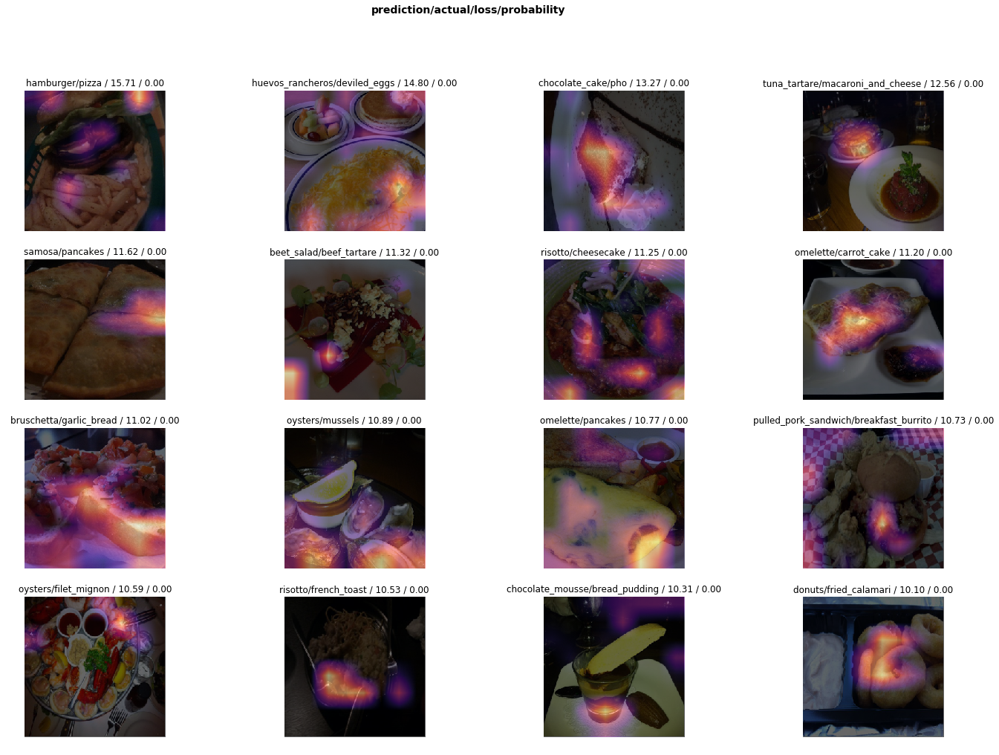

In [33]:
# Display the top losses
interpreter.plot_top_losses(16, figsize=(24,16), heatmap=True)

In [34]:
# Start of inference test

## Custom test
This custom test set contains images from a Google Images search of 101 categories.
The images are the 1st 20 results of Google Images search with "homemade" followed by the category name as keyword.

(This dataset is the output of this kernel:<br>
https://www.kaggle.com/phananhvu/food-101-custom-test-creation-v2)

This additional test will verify the result of the validation step earlier.

In [35]:
# Unzip the custom test directory
zip_filepath = '../input/food-101-custom-test-creation-v2/food101-custom-test-homemade-and-keyword.zip'
custom_test_image_dir = os.path.join((os.getcwd()),'custom-test')
shutil.unpack_archive(zip_filepath, custom_test_image_dir)

# Inspect the test categories and look inside a category directory
test_categories = os.listdir(custom_test_image_dir)
print(len(test_categories))
print(os.listdir(os.path.join(custom_test_image_dir,'cheesecake')))

101
['cheesecake-6.jpg', 'cheesecake-12.jpg', 'cheesecake-7.jpg', 'cheesecake-10.jpeg', 'cheesecake-13.jpg', 'cheesecake-11.jpg', 'cheesecake-9.jpg', 'cheesecake-18.jpg', 'cheesecake-16.jpg', 'cheesecake-19.jpg', 'cheesecake-15.jpg', 'cheesecake-0.jpg', 'cheesecake-5.jpg', 'cheesecake-14.jpg', 'cheesecake-17.jpg', 'cheesecake-4.jpg', 'cheesecake-2.jpg', 'cheesecake-1.jpg', 'cheesecake-8.jpg', 'cheesecake-3.jpg']


In [36]:
# Images from Google often have high contrast and brightness. Therefore, transform should reduce contrast and brightness to create more variation
custom_test_image_transforms = get_transforms(
    do_flip=False,
    max_rotate=None,
    max_zoom=1,
    max_lighting=None,
    max_warp=None,
    xtra_tfms=[
        brightness(change=(0.5-0.4, 0.5), p=0.5),
        contrast(scale=(1-0.6, 1), p=0.5),
    ]
)

In [37]:
# All images are considered as train data for now. They will be switched later to validation
custom_test_data = (ImageList.from_folder(custom_test_image_dir)
                    .split_none()
                    .label_from_folder()
                    .transform(custom_test_image_transforms, size=(256, 256), resize_method=ResizeMethod.SQUISH)
                    .databunch()
                    .normalize(imagenet_stats)
                   )
print(custom_test_data)

ImageDataBunch;

Train: LabelList (2010 items)
x: ImageList
Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256)
y: CategoryList
omelette,omelette,omelette,omelette,omelette
Path: /kaggle/working/custom-test;

Valid: LabelList (0 items)
x: ImageList

y: CategoryList

Path: /kaggle/working/custom-test;

Test: None


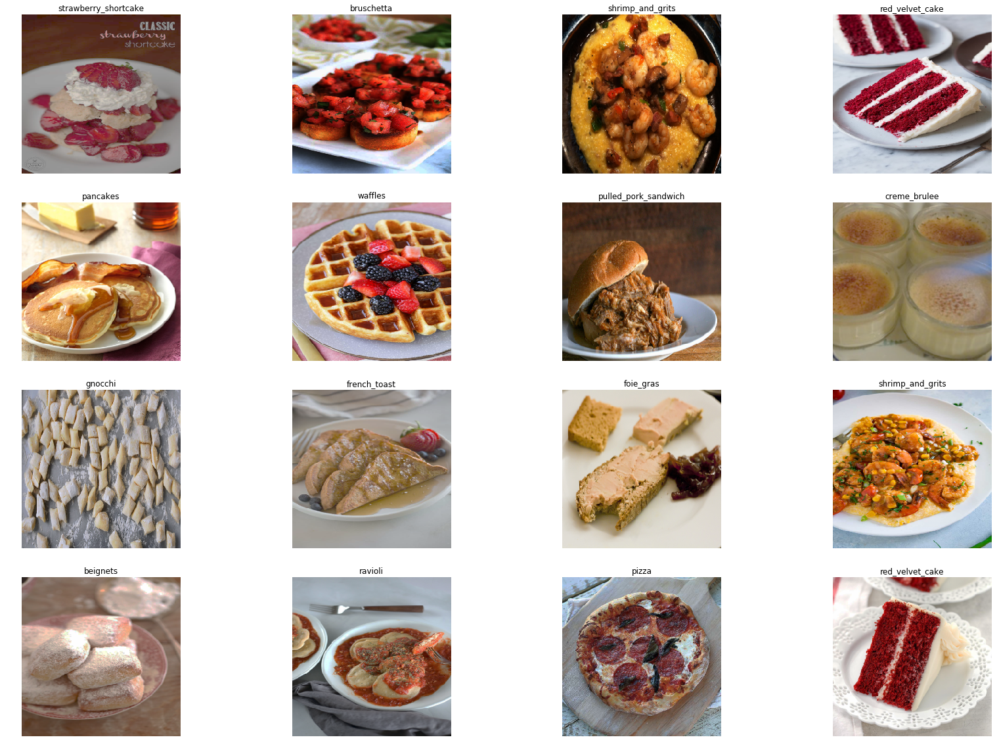

In [38]:
custom_test_data.show_batch(rows=4, figsize=(24,16))

In [39]:
# Keep a reference to the old training & validation data.
# Swap the old data with the new custom test data
old_data = image_learner.data
image_learner.data = custom_test_data

In [40]:
# Since all images are considered as train data earlier, now we point valididation data to train data
# This is necessary to use some useful interpretation later
image_learner.data.valid_dl = image_learner.data.train_dl

In [41]:
# Validate with custom test
image_learner.validate(image_learner.data.valid_dl)

[0.53639895, tensor(0.8634)]

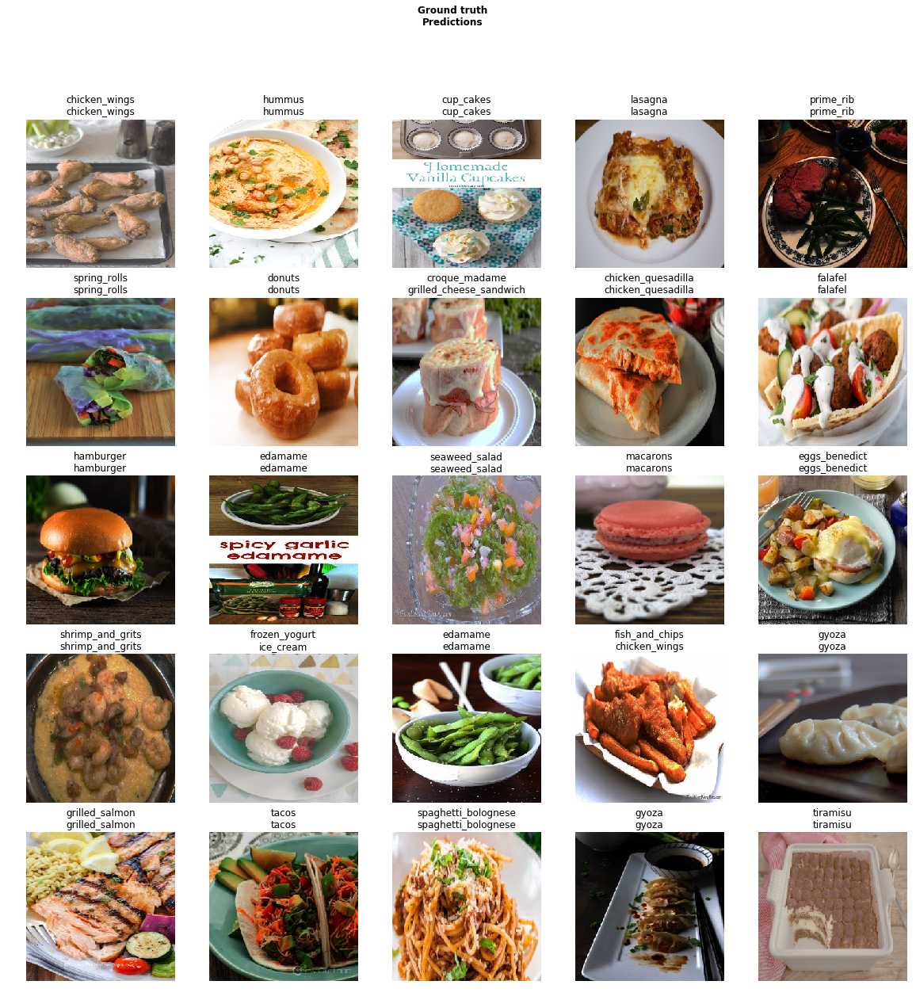

In [42]:
# Show a few results from custom test
image_learner.show_results(ds_type=DatasetType.Valid)

In [43]:
custom_test_interpreter = ClassificationInterpretation.from_learner(image_learner)

In [44]:
custom_test_interpreter.most_confused(min_val=3)

[('frozen_yogurt', 'ice_cream', 14),
 ('gnocchi', 'cheese_plate', 5),
 ('lobster_bisque', 'chicken_curry', 5),
 ('dumplings', 'clam_chowder', 4),
 ('filet_mignon', 'steak', 4),
 ('pad_thai', 'ramen', 4),
 ('sashimi', 'sushi', 4),
 ('spaghetti_carbonara', 'spaghetti_bolognese', 4),
 ('baby_back_ribs', 'steak', 3),
 ('beignets', 'donuts', 3),
 ('bread_pudding', 'pizza', 3),
 ('chocolate_mousse', 'chocolate_cake', 3),
 ('dumplings', 'chicken_curry', 3),
 ('french_toast', 'grilled_cheese_sandwich', 3),
 ('frozen_yogurt', 'cup_cakes', 3),
 ('miso_soup', 'hot_and_sour_soup', 3),
 ('peking_duck', 'baby_back_ribs', 3),
 ('pork_chop', 'steak', 3),
 ('ravioli', 'oysters', 3)]

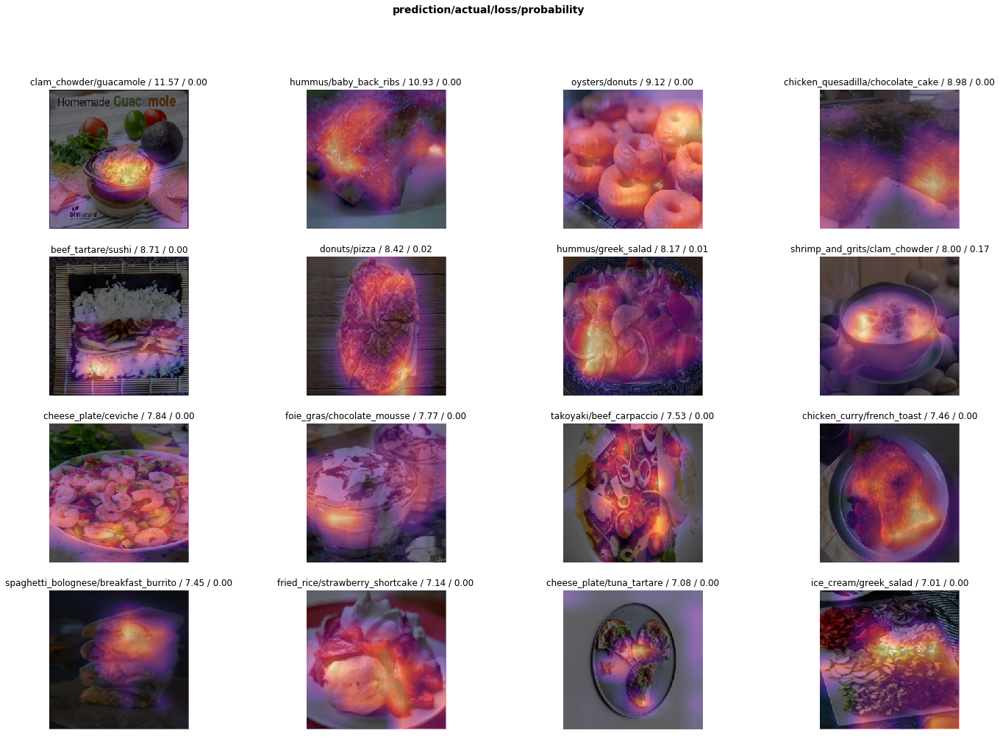

In [45]:
# Top losses from custom test
custom_test_interpreter.plot_top_losses(16, figsize=(24,16), heatmap=True)

In [46]:
# return top n predicted classes and probabilities in descending order
def get_top_predictions(img_learner, img, top_n=5):
    prediction = img_learner.predict(img)
    # predict return in order: the class, the label and the probabilities
    probabilities = prediction[2]
    # Partition probabilities so that indexes of n biggest probabilities are at the end
    partitioned_indexes = np.argpartition(probabilities, -top_n)
    # Extract the indexes of these top probabilities
    top_probability_indexes = partitioned_indexes[-top_n:]
    
    # Get the values of these top probabilities
    top_probabilities = probabilities[top_probability_indexes]
    # Sort the indexes of these top probabilities in ascending order
    sorted_meta_indexes = np.argsort(top_probabilities)
    # Rearrange the indexes of the top probabilities in ascending order
    sorted_top_indexes = top_probability_indexes[sorted_meta_indexes]
    # Get the top probabilities in descending order. Convert to numpy because PyTorch is not currently supporting backward slicing
    sorted_top_probabilities = probabilities[sorted_top_indexes].numpy()[::-1]
    
    # Get the top classes in descending order. Convert to numpy because PyTorch is not currently supporting backward slicing
    class_nparray = np.array(img_learner.data.classes)
    sorted_classes = class_nparray[sorted_top_indexes][::-1]
    
    for label, probability in zip(sorted_classes, sorted_top_probabilities):
        print("{:f} {:s}".format(probability, label))
    return sorted_classes, sorted_top_probabilities

0.984489 guacamole
0.014539 hummus
0.000434 nachos
0.000239 chicken_quesadilla
0.000089 ceviche


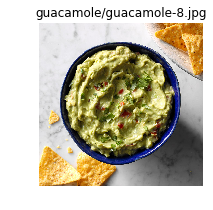

In [47]:
# predict a random image from the custom test directory
def display_and_predict_dir(img_learner, img_test_dir):
    sample_categ = random.choice(os.listdir(img_test_dir))
    sample_categ_path = os.path.join(img_test_dir, sample_categ)
    sample_file = random.choice(os.listdir(sample_categ_path))
    
    test_image = open_image(os.path.join(sample_categ_path, sample_file))
    test_image.show(title='/'.join([sample_categ, sample_file]))

    top_clss, top_proba = get_top_predictions(img_learner, test_image, top_n=5)
    return top_clss, top_proba

test_top_classes, test_top_probabilities = display_and_predict_dir(image_learner, custom_test_image_dir)

In [48]:
# Create a test directory to hold downloaded image
downloaded_test_image_dir = Path.cwd().joinpath('download-test-image')
downloaded_test_image_dir.mkdir(parents=True, exist_ok=True)
print(os.listdir(os.getcwd()))

['tmp.pth', '__notebook__.ipynb', 'stage2-resnet50-size256.pth', 'custom-test', 'stage2-resnet50-size256-export.pkl', '__output__.json', 'download-test-image', 'stage1-resnet50-size256.pth']


0.657259 cheesecake
0.265563 chocolate_mousse
0.039785 tiramisu
0.014714 chocolate_cake
0.012808 panna_cotta


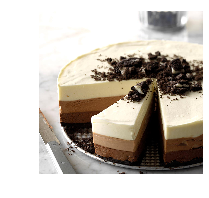

In [49]:
# Get an image from a url and return the top predictions in descending order
def display_and_predict_url(img_learner, img_url, test_img_dir):
    urllib.request.urlretrieve(img_url, test_img_dir/'test1.jpg')
    test_image = open_image(test_img_dir/'test1.jpg')
    test_image.show()

    top_clss, top_proba = get_top_predictions(img_learner, test_image, top_n=5)
    return top_clss, top_proba

test_image_url = 'https://tmbidigitalassetsazure.blob.core.windows.net/secure/RMS/attachments/37/1200x1200/Triple-Chocolate-Mousse-Torte_EXPS_SDAM18_212092_C11_29_2b.jpg'
test_top_classes, test_top_probabilities = display_and_predict_url(image_learner, test_image_url, downloaded_test_image_dir)

In [50]:
# Remove unzipped images due to output file number restriction
shutil.rmtree(custom_test_image_dir, ignore_errors=True)
shutil.rmtree(downloaded_test_image_dir, ignore_errors=True)

## Further improvements

Try Test Time Augmentation <br><br>
Experiment with other model architectures <br>
https://devpost.com/software/food101-classification<br>


Try other parameters for image transformation <br><br>
Progressively resize images while training (1st, train with smaller images (256x256), then train with bigger image (512x512). This might go beyond the kernel running time limit of Kaggle) <br>


Validate and inspect with other similar dataset <br>
http://visiir.lip6.fr/#demo <br>
https://www.groundai.com/project/foodx-251-a-dataset-for-fine-grained-food-classification/1 <br>
https://kuanghuei.github.io/Food-101N/ <br>